In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd

In [2]:
pd.set_option('display.max_rows', 500)

In [3]:
file_path = 'C:/Users/Jacob/Documents/datasets/mimic-iv-0.4/'
save_path = 'C:/Users/Jacob/Documents/datasets/mimic-iv-0.4-processed/'
if not os.path.exists(save_path):
    os.mkdir(save_path)

In [4]:
from tqdm import tqdm_notebook

adm = pd.read_csv(os.path.join(save_path, "icu", "admissions.csv"))
cht_file = os.path.join(file_path, "icu", "chartevents.csv")
cht_cols = ["subject_id", "hadm_id", "stay_id", "charttime", "itemid", "valuenum", "valueuom"]
chunksize = 100000
cht = []
# ***reading chartevents is slow***
# Documentation says `chartevents.csv` has 264885089 rows, there appear to be ~60 million more
for chunk in tqdm_notebook(pd.read_csv(cht_file, usecols=cht_cols, chunksize=chunksize), total=(327363274//chunksize)+1, smoothing=0.01):
    chunk = chunk[~chunk["valuenum"].isna()]
    chunk = chunk.loc[chunk["hadm_id"].isin(adm["hadm_id"])]
    cht.append(chunk)
# N.B. - ignores "value", so only uses numeric lab values

In [5]:
cht = pd.concat(cht)

In [6]:
# Require a value with a unit of measurement
print(cht["valueuom"].isna().sum())
# lab = lab.drop(lab.loc[lab["valueuom"].isna()].index)

print("Number of patients remaining in the database: ")
print(cht["subject_id"].nunique())
print("Number of datapoints remaining in the database: ")
print(len(cht))
cht.head()

7912207
Number of patients remaining in the database: 
10820
Number of datapoints remaining in the database: 
22389581


,subject_id,hadm_id,stay_id,charttime,itemid,valuenum,valueuom
13,19999068,21606769,31096823,2161-08-30 20:00:00,224054,3.0,NaN
14,19999068,21606769,31096823,2161-08-30 20:00:00,224055,3.0,NaN
15,19999068,21606769,31096823,2161-08-30 20:00:00,224056,1.0,NaN
16,19999068,21606769,31096823,2161-08-30 20:00:00,224057,3.0,NaN
17,19999068,21606769,31096823,2161-08-30 20:00:00,224058,3.0,NaN


In [7]:
# Merge itemid
item_id = pd.read_csv(os.path.join(file_path, "icu", "d_items.csv"))
item_id = item_id[["itemid", "label"]]
cht = pd.merge(cht, item_id, on="itemid")

In [8]:
n_best = 100
#For each item, evaluate the number of patients who have been given this item.
pat_for_item = cht.groupby("label")["subject_id"].nunique()
# Order by occurence and take the 20 best (the ones with the most patients)
frequent_labels = pat_for_item.sort_values(ascending=False)[:n_best]

#Select only the time series with high occurence.
cht = cht.loc[cht["label"].isin(list(frequent_labels.index))]

print("Number of patients remaining in the database: ")
print(cht["subject_id"].nunique())

Number of patients remaining in the database: 
10820


### Units Cleaning

#### 1) In amounts

In [9]:
# Verification that all input labels have the same amounts units.
cht.groupby("label")["valueuom"].value_counts(dropna=False)

label                                        valueuom
18 Gauge Dressing Occlusive                  NaN           68722
18 Gauge placed in outside facility          NaN           68505
20 Gauge Dressing Occlusive                  NaN           93244
20 Gauge placed in outside facility          NaN           92766
20 Gauge placed in the field                 NaN           79082
Admission Weight (Kg)                        kg            10953
Admission Weight (lbs.)                      NaN           20343
Alarms On                                    NaN          243387
Ambulatory aid                               NaN           99959
Anion gap                                    mEq/L         68213
                                             NaN               7
Apnea Interval                               sec          154200
Arterial Base Excess                         mEq/L         56627
                                             NaN              31
Arterial CO2 Pressure               

In [10]:
# Correct the units
for label in tqdm_notebook(sorted(cht["label"].unique())):
    subset = cht.loc[cht["label"] == label]
    if len(subset["valueuom"].unique()) > 1:
        cht = cht.drop(subset.loc[subset["valueuom"].isna()].index)

In [11]:
cht.groupby("label")["valueuom"].value_counts(dropna=False)

label                                        valueuom
18 Gauge Dressing Occlusive                  NaN           68722
18 Gauge placed in outside facility          NaN           68505
20 Gauge Dressing Occlusive                  NaN           93244
20 Gauge placed in outside facility          NaN           92766
20 Gauge placed in the field                 NaN           79082
Admission Weight (Kg)                        kg            10953
Admission Weight (lbs.)                      NaN           20343
Alarms On                                    NaN          243387
Ambulatory aid                               NaN           99959
Anion gap                                    mEq/L         68213
Apnea Interval                               sec          154200
Arterial Base Excess                         mEq/L         56627
Arterial CO2 Pressure                        mmHg          56667
Arterial O2 pressure                         mmHg          56660
BUN                                 

In [12]:
# #Only select the subset that was used in the paper (only missing is INR(PT))
# subset=["Albumin","Alanine Aminotransferase (ALT)","Alkaline Phosphatase","Anion Gap","Asparate Aminotransferase (AST)","Base Excess","Basophils","Bicarbonate","Bilirubin, Total","Calcium, Total","Calculated Total CO2","Chloride","Creatinine","Eosinophils","Glucose","Hematocrit","Hemoglobin",
# "Lactate","Lymphocytes","MCH","MCHC","MCV","Magnesium","Monocytes","Neutrophils","PT","PTT","Phosphate","Platelet Count","Potassium","RDW","Red Blood Cells","Sodium","Specific Gravity","Urea Nitrogen","White Blood Cells","pCO2","pH","pO2"]

# lab = lab.loc[lab["LABEL"].isin(subset)]

### Check for outliers

#### 1) In amounts

In [13]:
cht.groupby("label")["valuenum"].describe()

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
18 Gauge Dressing Occlusive,68722.0,0.985449,0.119749,0.00,1.00,1.00,1.00,1.0
18 Gauge placed in outside facility,68505.0,0.216247,0.411688,0.00,0.00,0.00,0.00,1.0
20 Gauge Dressing Occlusive,93244.0,0.984825,0.122250,0.00,1.00,1.00,1.00,1.0
20 Gauge placed in outside facility,92766.0,0.213613,0.409859,0.00,0.00,0.00,0.00,1.0
20 Gauge placed in the field,79082.0,0.020915,0.143101,0.00,0.00,0.00,0.00,1.0
Admission Weight (Kg),10953.0,83.071734,24.592987,1.00,66.80,80.00,95.30,310.0
Admission Weight (lbs.),20343.0,183.864519,58.414531,0.00,146.50,176.00,211.20,1927.9
Alarms On,243387.0,0.996191,0.061598,0.00,1.00,1.00,1.00,1.0
Ambulatory aid,99959.0,0.173021,1.832413,0.00,0.00,0.00,0.00,30.0


In [14]:
cht = cht.loc[cht["valuenum"] < 1000]
print(len(cht))

14728296


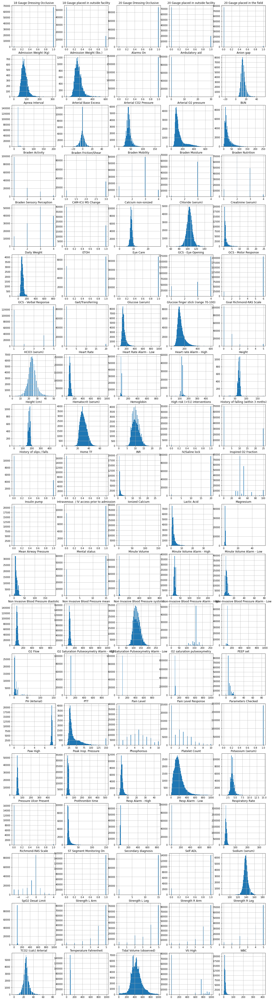

In [15]:
plt.figure(figsize=(20, 80))
for i, label in enumerate(sorted(cht["label"].unique())):
    plt.subplot(20, 5, 1+i)
    cht["valuenum"][cht["label"] == label].hist(bins=100)
    plt.title(label)

In [16]:
# Remove obvious outliers
cht = cht.drop(cht.loc[(cht["label"] == "Anion Gap") & ((cht["valuenum"] < 0) | (40 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Apnea Interval") & ((cht["valuenum"] < 0) | (50 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Arterial Base Excess") & ((cht["valuenum"] < -20) | (20 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Arterial CO2 Pressure") & ((cht["valuenum"] < 0) | (100 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Arterial O2 Pressure") & ((cht["valuenum"] < 0) | (500 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "BUN") & ((cht["valuenum"] < 0) | (150 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Calcium non-ionized") & ((cht["valuenum"] < 5) | (15 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Chloride (serum)") & ((cht["valuenum"] < 70) | (140 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Creatinine (serum)") & ((cht["valuenum"] < 0) | (10 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Daily Weight") & ((cht["valuenum"] < 1) | (250 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Glucose (serum)") & ((cht["valuenum"] < 0) | (400 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Glucose finger stick (range 70-100)") & ((cht["valuenum"] < 0) | (400 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Heart Rate") & ((cht["valuenum"] < 0) | (200 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Heart Rate Alarm - Low") & ((cht["valuenum"] < 0) | (200 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Heart rate Alarm - High") & ((cht["valuenum"] < 0) | (200 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Height") & ((cht["valuenum"] < 10) | (83 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Height (cm)") & ((cht["valuenum"] < 10) | (210 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Hematocrit (serum)") & ((cht["valuenum"] < 10) | (60 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Hemoglobin") & ((cht["valuenum"] < 4) | (20 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "INR") & ((cht["valuenum"] < 0) | (5 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Lactic Acid") & ((cht["valuenum"] < 0) | (15 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Magnesium") & ((cht["valuenum"] < 0) | (4 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Mean Airway Pressure") & ((cht["valuenum"] < 0) | (40 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Minute Volume") & ((cht["valuenum"] < 0) | (40 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Minute Volume Alarm - High") & ((cht["valuenum"] < 0) | (40 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Minute Volume Alarm - Low") & ((cht["valuenum"] < 0) | (20 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Non Invasive Blood Pressure diastolic") & ((cht["valuenum"] < 0) | (200 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Non Invasive Blood Pressure mean") & ((cht["valuenum"] < 0) | (200 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Non Invasive Blood Pressure systolic") & ((cht["valuenum"] < 50) | (200 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Non-Invasive Blood Pressure Alarm - High") & ((cht["valuenum"] < 0) | (200 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Non-Invasive Blood Pressure Alarm - Low") & ((cht["valuenum"] < 0) | (200 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "O2 Flow") & ((cht["valuenum"] < 0) | (50 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "O2 Saturation Pulseoxymetry Alarm - High") & ((cht["valuenum"] < 80) | (100 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "O2 Saturation Pulseoxymetry Alarm - Low") & ((cht["valuenum"] < 80) | (100 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "O2 saturation pulseoxymetry") & ((cht["valuenum"] < 80) | (100 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "PEEP Set") & ((cht["valuenum"] < 0) | (20 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "PH (Arterial)") & ((cht["valuenum"] < 6.9) | (7.6 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "PTT") & ((cht["valuenum"] < 0) | (125 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Paw High") & ((cht["valuenum"] < 20) | (80 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Peak Insp. Pressure") & ((cht["valuenum"] < 0) | (50 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Phosphorous") & ((cht["valuenum"] < 0) | (12 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Potassium (serum)") & ((cht["valuenum"] < 2.5) | (7.5 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Prothrombin time") & ((cht["valuenum"] < 0) | (50 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Resp Alarm - High") & ((cht["valuenum"] < 0) | (70 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Resp Alarm - Low") & ((cht["valuenum"] < 0) | (70 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Respiratory Rate") & ((cht["valuenum"] < 5) | (50 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Sodium (serum)") & ((cht["valuenum"] < 120) | (160 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "SpO2 Desat Limit") & ((cht["valuenum"] < 75) | (100 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "TCO2 (calc) Arterial") & ((cht["valuenum"] < 0) | (60 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Temperature Fahrenheit") & ((cht["valuenum"] < 90) | (110 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Tidal Volume") & ((cht["valuenum"] < 1) | (1000 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "Vti High") & ((cht["valuenum"] < 600) | (1000 < cht["valuenum"]))].index)
cht = cht.drop(cht.loc[(cht["label"] == "WBC") & ((cht["valuenum"] < 0) | (75 < cht["valuenum"]))].index)

print("Number of patients remaining in the database: ")
print(cht["subject_id"].nunique())
print("Number of datapoints remaining in the database: ")
print(len(cht))

Number of patients remaining in the database: 
10820
Number of datapoints remaining in the database: 
14632861


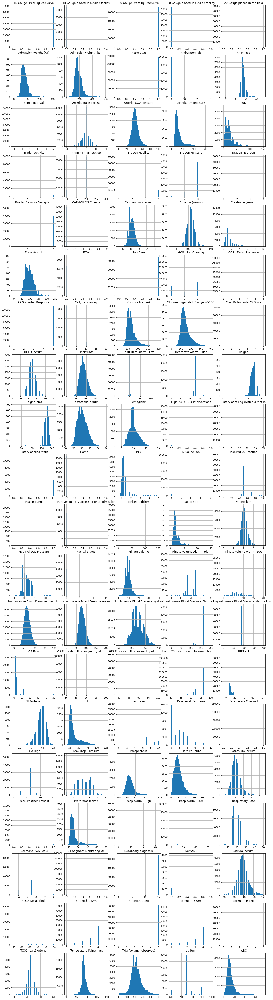

In [17]:
plt.figure(figsize=(20, 80))
for i, label in enumerate(sorted(cht["label"].unique())):
    plt.subplot(20, 5, 1+i)
    cht["valuenum"][cht["label"] == label].hist(bins=100)
    plt.title(label)

In [18]:
cht.to_csv(os.path.join(save_path, "icu", "chartevents.csv"))

## GaussRank rescaling

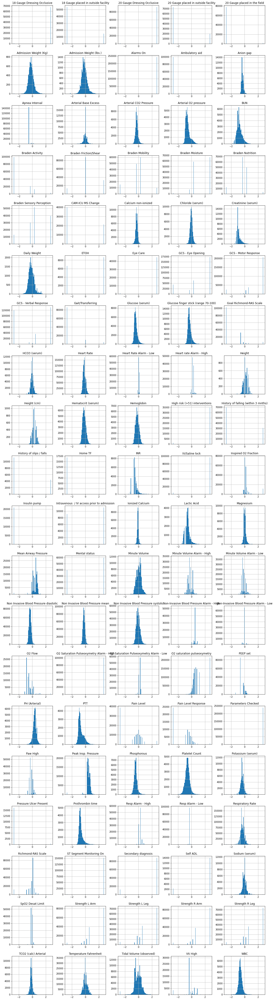

In [19]:
from gauss_rank_scaler import GaussRankScaler

fig, axes = plt.subplots(20, 5, figsize=(20, 80))
axes = [ax for sub_ax in axes for ax in sub_ax]
for i, label in enumerate(sorted(cht["label"].unique())):
    scaler = GaussRankScaler()
    series = cht["valuenum"][cht["label"] == label]
    X_train_new = scaler.fit_transform(series[:, np.newaxis])
    pd.DataFrame(X_train_new, columns=[label]).hist(ax=axes[i], bins=100)